In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ue-city-dataset/SemanticClasses.csv
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_1206.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_932.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_2288.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_1416.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_1746.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_1159.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_767.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_1780.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_973.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_930.jpg
/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB/rgb_frame_611.jpg
/kaggle/input/ue-cit

In [2]:
import torch.optim as optim
from tqdm import tqdm 
import matplotlib.pyplot as plt
import numpy as np
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Data Analysis

Processing images: 100%|██████████| 1720/1720 [06:20<00:00,  4.52it/s]


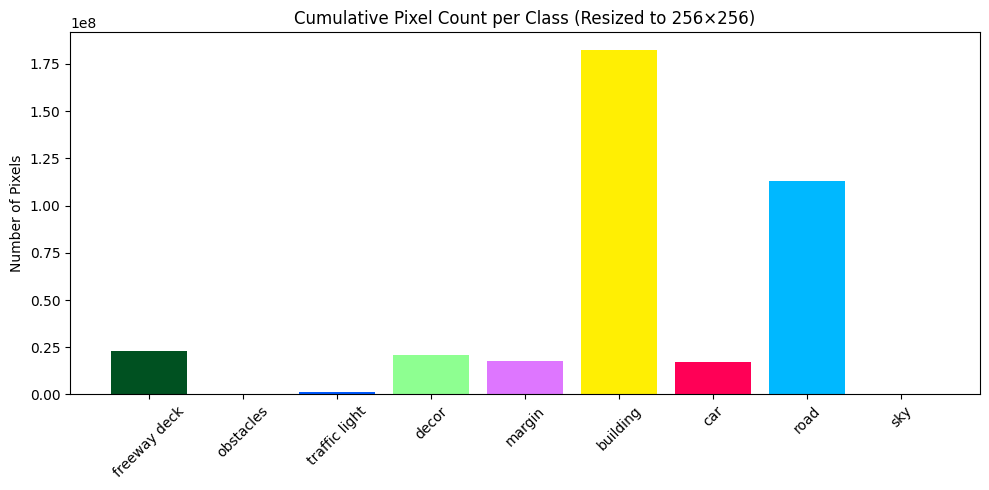

In [4]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

# Configuration
image_folder = '/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/train/Semantic'  # Replace with your folder path
TOLERANCE = 10
RESIZE_SHAPE = (512, 512)

# Define class colors
class_colors = {
    "freeway deck": [0, 81, 33],
    "obstacles": [83, 21, 0],
    "traffic light": [0, 89, 254],
    "decor": [142, 255, 145],
    "margin": [222, 118, 255],
    "building": [255, 239, 3],
    "car": [255, 0, 86],
    "road": [0, 184, 255],
    "sky": [255, 255, 255],
}

# Preprocess: convert class colors to NumPy
class_colors_np = {cls: np.array(rgb) for cls, rgb in class_colors.items()}
pixel_counts = {cls: 0 for cls in class_colors}

# Function to process one image
def process_image(image_path):
    image = Image.open(image_path).convert("RGB").resize(RESIZE_SHAPE)
    pixels = np.array(image).reshape(-1, 3)  # Flatten to (H*W, 3)

    counts = {cls: 0 for cls in class_colors}
    for cls, color in class_colors_np.items():
        mask = np.all(np.abs(pixels - color) <= TOLERANCE, axis=1)
        counts[cls] = np.sum(mask)
    return counts

# Gather image files
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Process all images
for filename in tqdm(image_files, desc="Processing images"):
    image_path = os.path.join(image_folder, filename)
    counts = process_image(image_path)
    for cls in pixel_counts:
        pixel_counts[cls] += counts[cls]

# Plot results
plt.figure(figsize=(10, 5))
plt.bar(pixel_counts.keys(), pixel_counts.values(), color=[np.array(c)/255 for c in class_colors.values()])
plt.xticks(rotation=45)
plt.title("Cumulative Pixel Count per Class (Resized to 256×256)")
plt.ylabel("Number of Pixels")
plt.tight_layout()
plt.show()


In [5]:
# Compute total matched pixels
total_matched_pixels = sum(pixel_counts.values())

# Print class percentages
print("\nPercentage of each class:")
for cls, count in pixel_counts.items():
    percent = (count / total_matched_pixels) * 100 if total_matched_pixels > 0 else 0
    print(f"{cls:15}: {percent:.2f}%")


Percentage of each class:
freeway deck   : 5.44%
obstacles      : 0.06%
traffic light  : 0.36%
decor          : 4.93%
margin         : 4.18%
building       : 42.95%
car            : 4.09%
road           : 26.58%
sky            : 11.41%


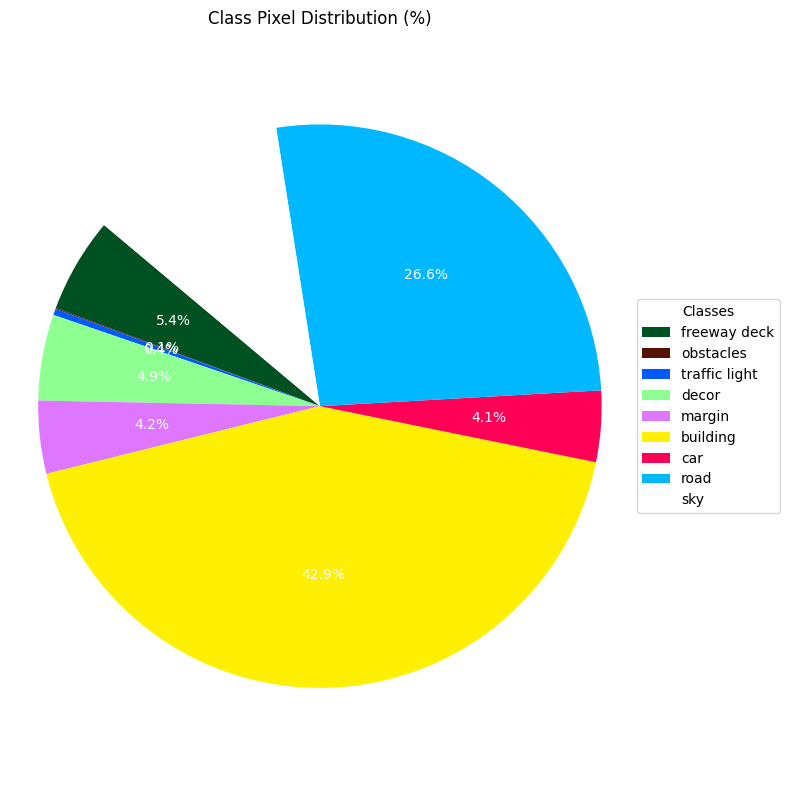

In [6]:
# Prepare pie chart data
labels = []
sizes = []
colors = []

for cls, count in pixel_counts.items():
    if count > 0:
        labels.append(cls)
        sizes.append(count)
        colors.append(np.array(class_colors[cls]) / 255)

# Plot pie chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    sizes,
    colors=colors,
    autopct='%1.1f%%',
    startangle=140,
    textprops=dict(color="w"),
)

# Add legend instead of slice labels
plt.legend(wedges, labels, title="Classes", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.axis('equal')  # Equal aspect ratio ensures pie is a circle.
plt.title("Class Pixel Distribution (%)")
plt.tight_layout()
plt.show()

# Weight the class

In [7]:
# Compute the total number of pixels
total_pixels = sum(pixel_counts.values())

# Calculate inverse frequency weights
inverse_frequencies = {}  # Store the inverse frequency for each class

for cls, count in pixel_counts.items():
    # Print the pixel count for each class
    print(f"{cls:15}: {count}")

    # Calculate the frequency (percentage) of the class
    class_frequency = count / total_pixels if total_pixels > 0 else 0

    # Compute the inverse frequency (underrepresented classes get higher weight)
    inverse_frequencies[cls] = 1 / (class_frequency + 1e-6)  # Small epsilon added to avoid division by zero

# Normalize inverse frequencies (optional, so highest weight is 1)
max_weight = max(inverse_frequencies.values())
normalized_weights = {cls: weight / max_weight for cls, weight in inverse_frequencies.items()}

# Print the normalized inverse frequency weights
print("\nNormalized Inverse Frequency Weights:")
for cls, weight in normalized_weights.items():
    print(f"{cls:15}: {weight:.4f}")

freeway deck   : 23140144
obstacles      : 251561
traffic light  : 1533715
decor          : 20959614
margin         : 17771495
building       : 182598134
car            : 17382327
road           : 113028506
sky            : 48507172

Normalized Inverse Frequency Weights:
freeway deck   : 0.0109
obstacles      : 1.0000
traffic light  : 0.1643
decor          : 0.0120
margin         : 0.0142
building       : 0.0014
car            : 0.0145
road           : 0.0022
sky            : 0.0052


# OG code

In [31]:
from torch.utils.data import Dataset
from PIL import Image
import os

class SemanticSegDataset(Dataset):
    def __init__(self, rgb_dir, mask_dir, rgb_transform=None, mask_transform=None):
        self.rgb_dir = rgb_dir
        self.mask_dir = mask_dir
        self.rgb_transform = rgb_transform
        self.mask_transform = mask_transform
        self.filenames = sorted(os.listdir(rgb_dir))

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        rgb_name = self.filenames[idx]
        rgb_path = os.path.join(self.rgb_dir, rgb_name)
        mask_name = rgb_name.replace("rgb", "semantic")
        mask_path = os.path.join(self.mask_dir, mask_name)

        rgb = Image.open(rgb_path).convert("RGB")
        mask = Image.open(mask_path)

        if self.rgb_transform:
            rgb = self.rgb_transform(rgb)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        return rgb, mask

In [32]:
import torchvision.transforms as T
from torch.utils.data import DataLoader

rgb_transform = T.Compose([
    T.Resize(520),  # Resize shorter side
    T.CenterCrop((512, 512)),
    T.ToTensor(),
])

mask_transform = T.Compose([
    T.Resize(520, interpolation=Image.NEAREST),
    T.CenterCrop((512, 512)),
    T.PILToTensor(),
])

train_dataset = SemanticSegDataset("/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/train/RGB", "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/train/Semantic", rgb_transform, mask_transform)
val_dataset = SemanticSegDataset("/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/RGB", "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/val/Semantic", rgb_transform, mask_transform)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4)

In [33]:
import torchvision.models.segmentation as models
import torch.nn as nn
import torch

NUM_CLASSES = 9  # Change to your actual number of classes

model = models.deeplabv3_resnet50(weights="DEFAULT")
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [34]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True, min_lr=2e-6)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [35]:
class EarlyStopping:
    def __init__(self, patience=20):
        self.patience = patience
        self.counter = 0
        self.best_acc = 0
        self.best_model_wts = None

    def step(self, acc, model):
        if acc > self.best_acc:
            self.best_acc = acc
            self.best_model_wts = model.state_dict()
            self.counter = 0
        else:
            self.counter += 1
        return self.counter >= self.patience

    def restore(self, model):
        if self.best_model_wts:
            model.load_state_dict(self.best_model_wts)

early_stopping = EarlyStopping(patience=20)

In [36]:
class_colors = {
    "freeway deck": [0, 81, 33],
    "obstacles": [83, 21, 0],
    "traffic light": [0, 89, 254], 
    "decor": [142, 255, 145],
    "margin": [222, 118, 255],
    "building": [255, 239, 3],
    "car": [255, 0, 86],
    "road": [0, 184, 255],
    "sky": [255, 255, 255],
}

color_to_class = {tuple(rgb): idx for idx, (class_name, rgb) in enumerate(class_colors.items())}

def rgb_to_class_indices(batch_rgb_masks, color_to_class):
    batch_class_masks = []
    for rgb_mask in batch_rgb_masks:
        rgb_mask = rgb_mask.transpose(1, 2, 0)  # (C, H, W) to (H, W, C)
        class_mask = np.zeros(rgb_mask.shape[:2], dtype=np.int64)
        for color, class_idx in color_to_class.items():
            mask = np.all(rgb_mask == np.array(color), axis=-1)
            class_mask[mask] = class_idx
        batch_class_masks.append(torch.tensor(class_mask, dtype=torch.long))
    return torch.stack(batch_class_masks)

In [27]:
# Get the ID (index) of the 'traffic light' class
traffic_light_id = list(class_colors.keys()).index("traffic light")
print(f"The ID of 'traffic light' is: {traffic_light_id}")

The ID of 'traffic light' is: 2


In [37]:
import tensorflow as tf

num_classes = len(class_colors)
class_names = [
    "freeway deck",  # 0
    "obstacles",     # 1
    "traffic light", # 2
    "decor",         # 3
    "margin",        # 4
    "building",      # 5
    "car",           # 6
    "road",          # 7
    "sky",           # 8
]

# Normalized weights for each class (from previous calculation)
class_weights = [
    0.0109,  # freeway deck
    1.0000,  # obstacles
    0.1643,  # traffic light
    0.0120,  # decor
    0.0142,  # margin
    0.0014,  # building
    0.0145,  # car
    0.0022,  # road
    0.0052   # sky
]

# Convert to tensor
weights_tensor = torch.tensor(class_weights, dtype=torch.float32)

# Initialize CrossEntropyLoss with class weights
criterion = nn.CrossEntropyLoss(weight=weights_tensor.to(device))

In [38]:
def compute_iou_dice(preds, masks, num_classes):
    ious = []
    dices = []
    preds = preds.view(-1)
    masks = masks.view(-1)
    for cls in range(num_classes):
        pred_inds = preds == cls
        target_inds = masks == cls
        intersection = (pred_inds & target_inds).sum().float()
        union = (pred_inds | target_inds).sum().float()
        dice = (2 * intersection) / (pred_inds.sum() + target_inds.sum() + 1e-6)
        iou = intersection / (union + 1e-6)
        if target_inds.sum() > 0: 
            ious.append(iou.item())
            dices.append(dice.item())
    return sum(ious) / len(ious), sum(dices) / len(dices)

Validating: 100%|██████████| 93/93 [00:48<00:00,  1.91batch/s]


Epoch 1/10, Loss: 0.6290, Acc: 82.60%, Val Loss: 0.3928, Val Acc: 86.46%, IoU: 0.5239, Dice: 0.6100


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.19batch/s]


Epoch 2/10, Loss: 0.3332, Acc: 88.32%, Val Loss: 0.3166, Val Acc: 89.47%, IoU: 0.5771, Dice: 0.6660


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 3/10, Loss: 0.2720, Acc: 89.97%, Val Loss: 0.2826, Val Acc: 90.84%, IoU: 0.6161, Dice: 0.7060


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 4/10, Loss: 0.2547, Acc: 90.67%, Val Loss: 0.2903, Val Acc: 89.50%, IoU: 0.6040, Dice: 0.6967


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.21batch/s]


Epoch 5/10, Loss: 0.2302, Acc: 91.20%, Val Loss: 0.2519, Val Acc: 91.28%, IoU: 0.6314, Dice: 0.7192


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 6/10, Loss: 0.2026, Acc: 92.24%, Val Loss: 0.2510, Val Acc: 90.89%, IoU: 0.6263, Dice: 0.7144


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.25batch/s]


Epoch 7/10, Loss: 0.1879, Acc: 92.76%, Val Loss: 0.2403, Val Acc: 92.32%, IoU: 0.6520, Dice: 0.7371


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 8/10, Loss: 0.1782, Acc: 93.14%, Val Loss: 0.2473, Val Acc: 91.74%, IoU: 0.6444, Dice: 0.7310


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.21batch/s]


Epoch 9/10, Loss: 0.1704, Acc: 93.40%, Val Loss: 0.2464, Val Acc: 91.91%, IoU: 0.6502, Dice: 0.7354


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 10/10, Loss: 0.1594, Acc: 93.84%, Val Loss: 0.2518, Val Acc: 92.79%, IoU: 0.6638, Dice: 0.7470


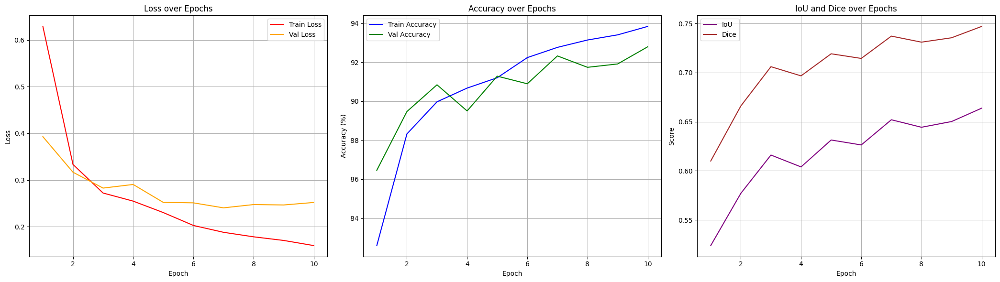

In [16]:
EPOCHS = 10
epoch_losses, epoch_accuracies, val_losses, val_accuracies = [], [], [], []
iou_scores, dice_scores = [], []

for epoch in range(EPOCHS):
    # -------- Training --------
    model.train()
    total_loss = 0
    total_correct = 0
    total_pixels = 0

    for images, rgb_masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Training", unit="batch"):
        images = images.to(device)
        masks = rgb_to_class_indices(rgb_masks.numpy(), color_to_class).to(device)

        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        total_correct += (preds == masks).sum().item()
        total_pixels += masks.numel()

    avg_train_loss = total_loss / len(train_loader)
    train_accuracy = total_correct / total_pixels * 100
    epoch_losses.append(avg_train_loss)
    epoch_accuracies.append(train_accuracy)

    # -------- Validation --------
    model.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0
    total_iou = 0
    total_dice = 0
    num_batches = 0

    with torch.no_grad():
        for images, rgb_masks in tqdm(val_loader, desc="Validating", unit="batch"):
            images = images.to(device)
            masks = rgb_to_class_indices(rgb_masks.numpy(), color_to_class).to(device)

            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            val_correct += (preds == masks).sum().item()
            val_total += masks.numel()

            # Compute IoU and Dice
            iou, dice = compute_iou_dice(preds, masks, NUM_CLASSES)
            total_iou += iou
            total_dice += dice
            num_batches += 1

    avg_val_loss = val_loss / len(val_loader)
    val_accuracy = val_correct / val_total * 100
    avg_iou = total_iou / num_batches
    avg_dice = total_dice / num_batches

    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)
    iou_scores.append(avg_iou)
    dice_scores.append(avg_dice)

    # Scheduler and Early Stopping
    scheduler.step(val_accuracy)
    stop = early_stopping.step(val_accuracy, model)

    print(f"Epoch {epoch+1}/{EPOCHS}, "
          f"Loss: {avg_train_loss:.4f}, Acc: {train_accuracy:.2f}%, "
          f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.2f}%, "
          f"IoU: {avg_iou:.4f}, Dice: {avg_dice:.4f}")

    if stop:
        print("Early stopping triggered.")
        break

early_stopping.restore(model)
plt.figure(figsize=(21, 6))

plt.subplot(1, 3, 1)
plt.plot(range(1, len(epoch_losses)+1), epoch_losses, label='Train Loss', color='red')
plt.plot(range(1, len(val_losses)+1), val_losses, label='Val Loss', color='orange')
plt.title("Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(range(1, len(epoch_accuracies)+1), epoch_accuracies, label='Train Accuracy', color='blue')
plt.plot(range(1, len(val_accuracies)+1), val_accuracies, label='Val Accuracy', color='green')
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.grid(True)
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(range(1, len(iou_scores)+1), iou_scores, label='IoU', color='purple')
plt.plot(range(1, len(dice_scores)+1), dice_scores, label='Dice', color='brown')
plt.title("IoU and Dice over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

In [17]:
import torch

# Save model weights
torch.save(model.state_dict(), 'deeplab_weights_v6_10epoch.pth')

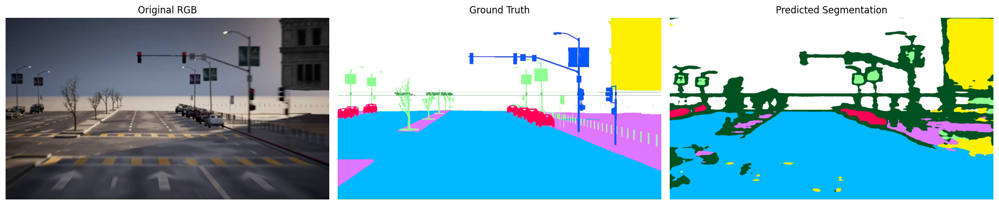

In [25]:
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

model.eval()

rgb_path = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/RGB/rgb_frame_1035.jpg"               # ← Update
gt_mask_path = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/Semantic/semantic_frame_1035.jpg" # ← Update

# Load RGB and GT mask
image = Image.open(rgb_path).convert("RGB")
gt_mask = Image.open(gt_mask_path).convert("RGB")
original_size = image.size

# Transform
transform = transforms.Compose([
    transforms.Resize((1024, 1024)),
    transforms.ToTensor()
])

# Process input image
input_tensor = transform(image).unsqueeze(0).to(device)

# Inference
model.eval()
with torch.no_grad():
    output = model(input_tensor)['out']
    pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

# Decode prediction
def decode_segmentation(mask, class_colors):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for idx, (class_name, color) in enumerate(class_colors.items()):
        color_mask[mask == idx] = color
    return color_mask

pred_color = decode_segmentation(pred, class_colors)
pred_image_resized = Image.fromarray(pred_color).resize(original_size)

# Plot
plt.figure(figsize=(18, 6))

# Original RGB
plt.subplot(1, 3, 1)
plt.title("Original RGB")
plt.imshow(image)
plt.axis("off")

# Ground Truth
plt.subplot(1, 3, 2)
plt.title("Ground Truth")
plt.imshow(gt_mask)
plt.axis("off")

# Predicted Segmentation
plt.subplot(1, 3, 3)
plt.title("Predicted Segmentation")
plt.imshow(pred_image_resized)
plt.axis("off")

plt.tight_layout()
plt.show()

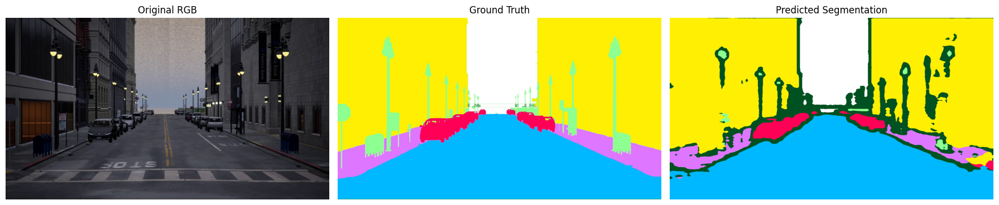

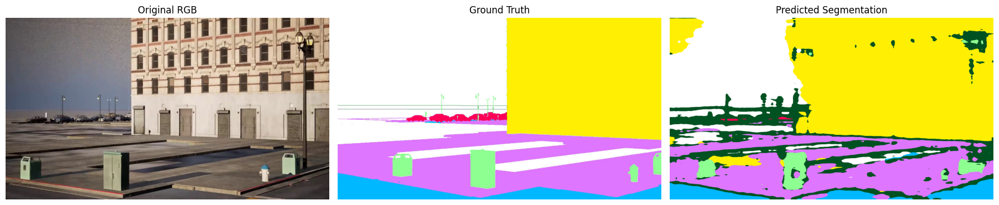

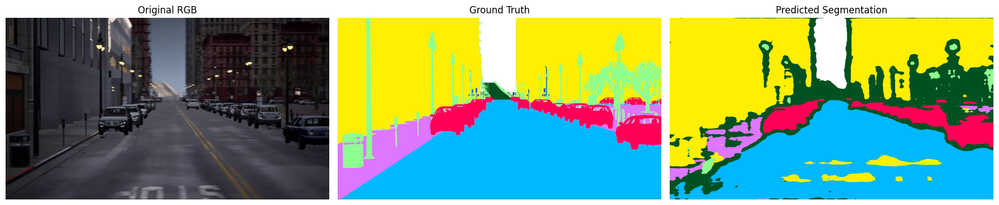

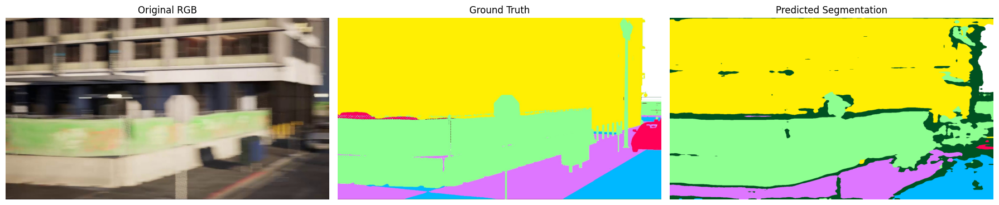

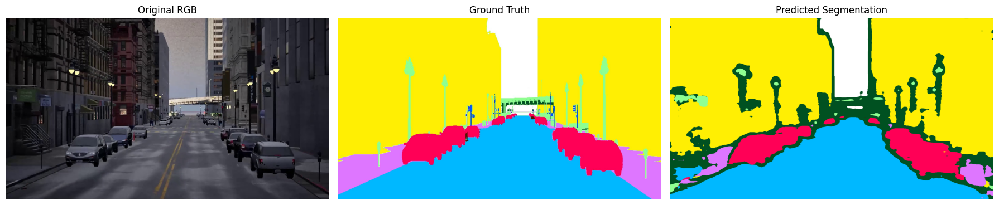

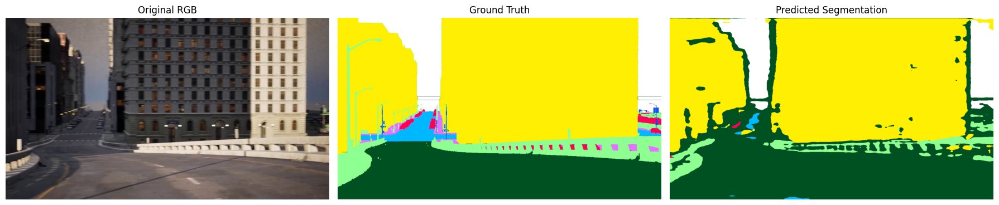

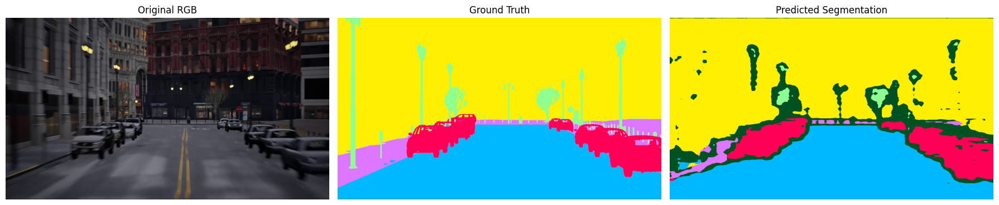

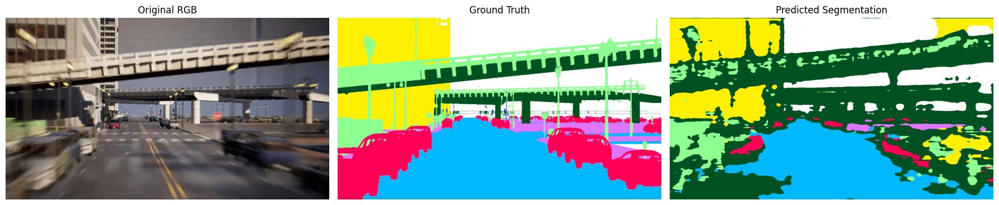

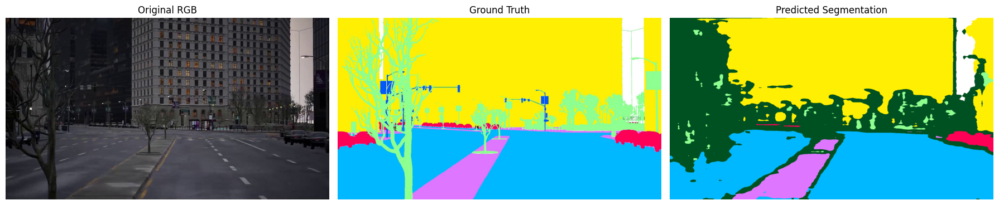

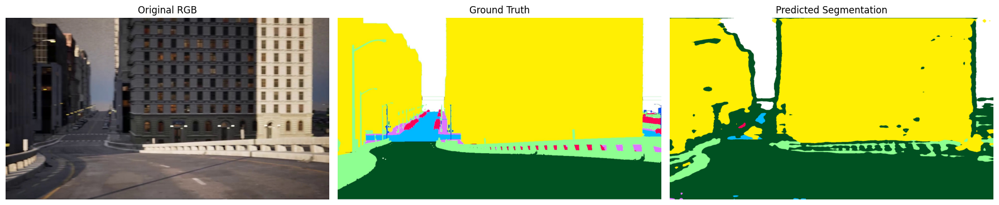

In [24]:
import os
import random
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Set model to eval mode
model.eval()

# Update paths
rgb_dir = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/RGB"
gt_dir = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/Semantic"

# Get all RGB filenames
rgb_files = sorted(os.listdir(rgb_dir))
random.shuffle(rgb_files)
rgb_files = rgb_files[:10]  # Select 10 random images

# Transform
transform = transforms.Compose([
    transforms.Resize((1024, 1024)),
    transforms.ToTensor()
])

# Function to decode segmentation
def decode_segmentation(mask, class_colors):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for idx, (class_name, color) in enumerate(class_colors.items()):
        color_mask[mask == idx] = color
    return color_mask

# Inference and plot
for fname in rgb_files:
    rgb_path = os.path.join(rgb_dir, fname)
    gt_path = os.path.join(gt_dir, fname.replace("rgb", "semantic"))

    image = Image.open(rgb_path).convert("RGB")
    gt_mask = Image.open(gt_path).convert("RGB")
    original_size = image.size

    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)['out']
        pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    pred_color = decode_segmentation(pred, class_colors)
    pred_image_resized = Image.fromarray(pred_color).resize(original_size)

    # Plot
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.title("Original RGB")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(gt_mask)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Predicted Segmentation")
    plt.imshow(pred_image_resized)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Post processing

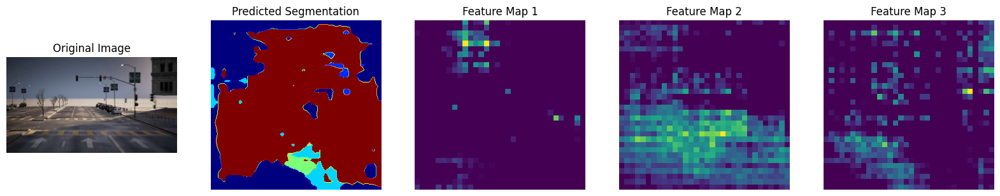

In [27]:
import torch
import torch.nn as nn
import torchvision.models.segmentation as segmentation
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Define a simple U-Net-like model for segmentation (replace with your model if needed)
model = segmentation.deeplabv3_resnet50(pretrained=False, num_classes=9)  # 3 classes for simplicity
model.eval()

# Hook to capture feature maps from a specific layer
feature_maps = []
def hook(module, input, output):
    feature_maps.append(output)

# Register hook to an intermediate layer (e.g., a layer in the backbone)
target_layer = model.backbone.layer4  # Adjust this to the layer you want to inspect
handle = target_layer.register_forward_hook(hook)

# Load and preprocess the image (replace 'input_image.jpg' with your image path)
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
image = Image.open('/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/RGB/rgb_frame_1035.jpg').convert('RGB')  # Use the original RGB image from your example
input_tensor = transform(image).unsqueeze(0)

# Forward pass to get predictions and feature maps
with torch.no_grad():
    output = model(input_tensor)['out']
    predicted_segmentation = torch.argmax(output, dim=1).squeeze().numpy()

# Feature maps are now stored in feature_maps[0]
feature_map = feature_maps[0].squeeze().detach().numpy()  # Shape: (channels, height, width)

# Visualize the original image, predicted segmentation, and a few feature maps
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

# Original image
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Predicted segmentation
axes[1].imshow(predicted_segmentation, cmap='jet')
axes[1].set_title("Predicted Segmentation")
axes[1].axis('off')

# Visualize a few feature maps (e.g., first 3 channels)
for i in range(3):
    axes[i+2].imshow(feature_map[i], cmap='viridis')
    axes[i+2].set_title(f"Feature Map {i+1}")
    axes[i+2].axis('off')

plt.savefig('feature_maps_visualization.png')

# Clean up the hook
handle.remove()

# 50 epochs

In [29]:
import tensorflow as tf

num_classes = len(class_colors)
class_names = [
    "freeway deck",  # 0
    "obstacles",     # 1
    "traffic light", # 2
    "decor",         # 3
    "margin",        # 4
    "building",      # 5
    "car",           # 6
    "road",          # 7
    "sky",           # 8
]

# Normalized weights for each class (from previous calculation)
class_weights = [
    0.0109,  # freeway deck
    1.0000,  # obstacles
    0.1643,  # traffic light
    0.0120,  # decor
    0.0142,  # margin
    0.0014,  # building
    0.0145,  # car
    0.0022,  # road
    0.0052   # sky
]

# Convert to tensor
weights_tensor = torch.tensor(class_weights, dtype=torch.float32)

# Initialize CrossEntropyLoss with class weights
criterion = nn.CrossEntropyLoss(weight=weights_tensor.to(device))

Validating: 100%|██████████| 93/93 [00:42<00:00,  2.20batch/s]


Epoch 1/50, Loss: 0.6477, Acc: 82.28%, Val Loss: 0.3931, Val Acc: 88.78%, IoU: 0.5647, Dice: 0.6569


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.17batch/s]


Epoch 2/50, Loss: 0.3254, Acc: 88.78%, Val Loss: 0.3226, Val Acc: 88.75%, IoU: 0.5798, Dice: 0.6714


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.21batch/s]


Epoch 3/50, Loss: 0.2621, Acc: 90.39%, Val Loss: 0.2808, Val Acc: 90.42%, IoU: 0.6148, Dice: 0.7057


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.21batch/s]


Epoch 4/50, Loss: 0.2326, Acc: 91.28%, Val Loss: 0.2892, Val Acc: 89.82%, IoU: 0.6043, Dice: 0.6944


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 5/50, Loss: 0.2269, Acc: 91.38%, Val Loss: 0.2725, Val Acc: 91.10%, IoU: 0.6208, Dice: 0.7089


Validating: 100%|██████████| 93/93 [00:43<00:00,  2.16batch/s]


Epoch 6/50, Loss: 0.2037, Acc: 92.15%, Val Loss: 0.2453, Val Acc: 91.96%, IoU: 0.6437, Dice: 0.7296


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.20batch/s]


Epoch 7/50, Loss: 0.1978, Acc: 92.42%, Val Loss: 0.2608, Val Acc: 91.17%, IoU: 0.6338, Dice: 0.7214


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 8/50, Loss: 0.1788, Acc: 93.16%, Val Loss: 0.2362, Val Acc: 92.13%, IoU: 0.6511, Dice: 0.7362


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.27batch/s]


Epoch 9/50, Loss: 0.1635, Acc: 93.70%, Val Loss: 0.2395, Val Acc: 92.34%, IoU: 0.6583, Dice: 0.7427


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 10/50, Loss: 0.1622, Acc: 93.72%, Val Loss: 0.2544, Val Acc: 92.02%, IoU: 0.6512, Dice: 0.7371


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 11/50, Loss: 0.1529, Acc: 94.10%, Val Loss: 0.2433, Val Acc: 92.52%, IoU: 0.6607, Dice: 0.7440


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 12/50, Loss: 0.1421, Acc: 94.54%, Val Loss: 0.2490, Val Acc: 92.85%, IoU: 0.6643, Dice: 0.7472


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 13/50, Loss: 0.1350, Acc: 94.80%, Val Loss: 0.2554, Val Acc: 93.08%, IoU: 0.6688, Dice: 0.7514


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 14/50, Loss: 0.1297, Acc: 95.03%, Val Loss: 0.2519, Val Acc: 93.09%, IoU: 0.6697, Dice: 0.7515


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.25batch/s]


Epoch 15/50, Loss: 0.1234, Acc: 95.27%, Val Loss: 0.2607, Val Acc: 92.85%, IoU: 0.6676, Dice: 0.7503


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.25batch/s]


Epoch 16/50, Loss: 0.1222, Acc: 95.30%, Val Loss: 0.2705, Val Acc: 93.34%, IoU: 0.6705, Dice: 0.7513


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.27batch/s]


Epoch 17/50, Loss: 0.1188, Acc: 95.43%, Val Loss: 0.2772, Val Acc: 93.47%, IoU: 0.6756, Dice: 0.7560


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.20batch/s]


Epoch 18/50, Loss: 0.1774, Acc: 93.27%, Val Loss: 0.2444, Val Acc: 92.97%, IoU: 0.6662, Dice: 0.7485


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 19/50, Loss: 0.1272, Acc: 95.08%, Val Loss: 0.2584, Val Acc: 93.43%, IoU: 0.6772, Dice: 0.7571


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 20/50, Loss: 0.1094, Acc: 95.80%, Val Loss: 0.2681, Val Acc: 93.77%, IoU: 0.6827, Dice: 0.7615


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 21/50, Loss: 0.1026, Acc: 96.08%, Val Loss: 0.2849, Val Acc: 93.70%, IoU: 0.6809, Dice: 0.7596


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.23batch/s]


Epoch 22/50, Loss: 0.1004, Acc: 96.15%, Val Loss: 0.2853, Val Acc: 93.83%, IoU: 0.6840, Dice: 0.7620


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.21batch/s]


Epoch 23/50, Loss: 0.0984, Acc: 96.27%, Val Loss: 0.2925, Val Acc: 93.94%, IoU: 0.6839, Dice: 0.7618


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.18batch/s]


Epoch 24/50, Loss: 0.0966, Acc: 96.34%, Val Loss: 0.2986, Val Acc: 93.93%, IoU: 0.6876, Dice: 0.7660


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 25/50, Loss: 0.0973, Acc: 96.33%, Val Loss: 0.3094, Val Acc: 93.53%, IoU: 0.6760, Dice: 0.7561


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.25batch/s]


Epoch 26/50, Loss: 0.1477, Acc: 94.27%, Val Loss: 0.2653, Val Acc: 93.56%, IoU: 0.6799, Dice: 0.7592


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.25batch/s]


Epoch 27/50, Loss: 0.1019, Acc: 96.12%, Val Loss: 0.2909, Val Acc: 93.81%, IoU: 0.6857, Dice: 0.7639


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 28/50, Loss: 0.0904, Acc: 96.57%, Val Loss: 0.3093, Val Acc: 94.08%, IoU: 0.6876, Dice: 0.7645


Validating: 100%|██████████| 93/93 [00:40<00:00,  2.27batch/s]


Epoch 29/50, Loss: 0.0868, Acc: 96.73%, Val Loss: 0.3239, Val Acc: 94.14%, IoU: 0.6889, Dice: 0.7655


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.26batch/s]


Epoch 30/50, Loss: 0.0851, Acc: 96.83%, Val Loss: 0.3048, Val Acc: 93.87%, IoU: 0.6871, Dice: 0.7649


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.26batch/s]


Epoch 31/50, Loss: 0.0854, Acc: 96.82%, Val Loss: 0.3293, Val Acc: 94.22%, IoU: 0.6892, Dice: 0.7658


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 32/50, Loss: 0.0852, Acc: 96.85%, Val Loss: 0.3278, Val Acc: 93.95%, IoU: 0.6879, Dice: 0.7652


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 33/50, Loss: 0.0857, Acc: 96.84%, Val Loss: 0.3099, Val Acc: 93.90%, IoU: 0.6852, Dice: 0.7629


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 34/50, Loss: 0.0868, Acc: 96.78%, Val Loss: 0.3225, Val Acc: 94.09%, IoU: 0.6876, Dice: 0.7642


Validating: 100%|██████████| 93/93 [00:44<00:00,  2.10batch/s]


Epoch 35/50, Loss: 0.0866, Acc: 96.84%, Val Loss: 0.3272, Val Acc: 94.11%, IoU: 0.6886, Dice: 0.7654


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.18batch/s]


Epoch 36/50, Loss: 0.0832, Acc: 96.94%, Val Loss: 0.3453, Val Acc: 94.15%, IoU: 0.6897, Dice: 0.7661


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.16batch/s]


Epoch 37/50, Loss: 0.0824, Acc: 96.97%, Val Loss: 0.3413, Val Acc: 94.22%, IoU: 0.6905, Dice: 0.7673


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.17batch/s]


Epoch 38/50, Loss: 0.0765, Acc: 97.21%, Val Loss: 0.3461, Val Acc: 94.45%, IoU: 0.6956, Dice: 0.7708


Validating: 100%|██████████| 93/93 [00:43<00:00,  2.12batch/s]


Epoch 39/50, Loss: 0.0723, Acc: 97.38%, Val Loss: 0.3602, Val Acc: 94.51%, IoU: 0.6969, Dice: 0.7717


Validating: 100%|██████████| 93/93 [00:43<00:00,  2.16batch/s]


Epoch 40/50, Loss: 0.0707, Acc: 97.45%, Val Loss: 0.3674, Val Acc: 94.56%, IoU: 0.6972, Dice: 0.7718


Validating: 100%|██████████| 93/93 [00:43<00:00,  2.16batch/s]


Epoch 41/50, Loss: 0.0694, Acc: 97.51%, Val Loss: 0.3758, Val Acc: 94.60%, IoU: 0.6981, Dice: 0.7725


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.26batch/s]


Epoch 42/50, Loss: 0.0681, Acc: 97.56%, Val Loss: 0.3838, Val Acc: 94.62%, IoU: 0.6985, Dice: 0.7727


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.21batch/s]


Epoch 43/50, Loss: 0.0678, Acc: 97.60%, Val Loss: 0.3889, Val Acc: 94.62%, IoU: 0.6987, Dice: 0.7728


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.24batch/s]


Epoch 44/50, Loss: 0.0668, Acc: 97.63%, Val Loss: 0.3924, Val Acc: 94.66%, IoU: 0.6993, Dice: 0.7733


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 45/50, Loss: 0.0662, Acc: 97.66%, Val Loss: 0.4005, Val Acc: 94.67%, IoU: 0.6993, Dice: 0.7731


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 46/50, Loss: 0.0656, Acc: 97.69%, Val Loss: 0.4020, Val Acc: 94.68%, IoU: 0.6993, Dice: 0.7731


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.20batch/s]


Epoch 47/50, Loss: 0.0651, Acc: 97.71%, Val Loss: 0.4033, Val Acc: 94.69%, IoU: 0.6994, Dice: 0.7732


Validating: 100%|██████████| 93/93 [00:41<00:00,  2.22batch/s]


Epoch 48/50, Loss: 0.0647, Acc: 97.73%, Val Loss: 0.4038, Val Acc: 94.70%, IoU: 0.6995, Dice: 0.7733


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.20batch/s]


Epoch 49/50, Loss: 0.0640, Acc: 97.76%, Val Loss: 0.4080, Val Acc: 94.72%, IoU: 0.6999, Dice: 0.7735


Validating: 100%|██████████| 93/93 [00:42<00:00,  2.16batch/s]


Epoch 50/50, Loss: 0.0638, Acc: 97.77%, Val Loss: 0.4112, Val Acc: 94.72%, IoU: 0.6999, Dice: 0.7736


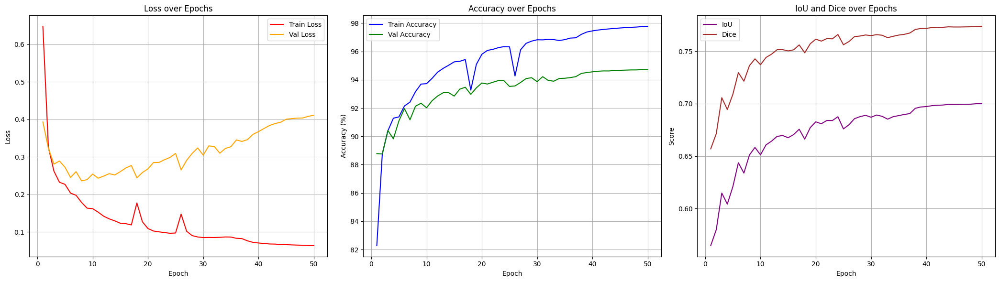

In [39]:
EPOCHS = 50
epoch_losses, epoch_accuracies, val_losses, val_accuracies = [], [], [], []
iou_scores, dice_scores = [], []

for epoch in range(EPOCHS):
    # -------- Training --------
    model.train()
    total_loss = 0
    total_correct = 0
    total_pixels = 0

    for images, rgb_masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Training", unit="batch"):
        images = images.to(device)
        masks = rgb_to_class_indices(rgb_masks.numpy(), color_to_class).to(device)

        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        total_correct += (preds == masks).sum().item()
        total_pixels += masks.numel()

    avg_train_loss = total_loss / len(train_loader)
    train_accuracy = total_correct / total_pixels * 100
    epoch_losses.append(avg_train_loss)
    epoch_accuracies.append(train_accuracy)

    # -------- Validation --------
    model.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0
    total_iou = 0
    total_dice = 0
    num_batches = 0

    with torch.no_grad():
        for images, rgb_masks in tqdm(val_loader, desc="Validating", unit="batch"):
            images = images.to(device)
            masks = rgb_to_class_indices(rgb_masks.numpy(), color_to_class).to(device)

            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            val_correct += (preds == masks).sum().item()
            val_total += masks.numel()

            # Compute IoU and Dice
            iou, dice = compute_iou_dice(preds, masks, NUM_CLASSES)
            total_iou += iou
            total_dice += dice
            num_batches += 1

    avg_val_loss = val_loss / len(val_loader)
    val_accuracy = val_correct / val_total * 100
    avg_iou = total_iou / num_batches
    avg_dice = total_dice / num_batches

    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)
    iou_scores.append(avg_iou)
    dice_scores.append(avg_dice)

    # Scheduler and Early Stopping
    scheduler.step(val_accuracy)
    stop = early_stopping.step(val_accuracy, model)

    print(f"Epoch {epoch+1}/{EPOCHS}, "
          f"Loss: {avg_train_loss:.4f}, Acc: {train_accuracy:.2f}%, "
          f"Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.2f}%, "
          f"IoU: {avg_iou:.4f}, Dice: {avg_dice:.4f}")

    if stop:
        print("Early stopping triggered.")
        break

early_stopping.restore(model)
plt.figure(figsize=(21, 6))

plt.subplot(1, 3, 1)
plt.plot(range(1, len(epoch_losses)+1), epoch_losses, label='Train Loss', color='red')
plt.plot(range(1, len(val_losses)+1), val_losses, label='Val Loss', color='orange')
plt.title("Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(range(1, len(epoch_accuracies)+1), epoch_accuracies, label='Train Accuracy', color='blue')
plt.plot(range(1, len(val_accuracies)+1), val_accuracies, label='Val Accuracy', color='green')
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.grid(True)
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(range(1, len(iou_scores)+1), iou_scores, label='IoU', color='purple')
plt.plot(range(1, len(dice_scores)+1), dice_scores, label='Dice', color='brown')
plt.title("IoU and Dice over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

In [43]:
# After completing training
torch.save(model.state_dict(), 'final_model.pth')
print("✅ Final model saved as 'final_model.pth'")

✅ Final model saved as 'final_model.pth'


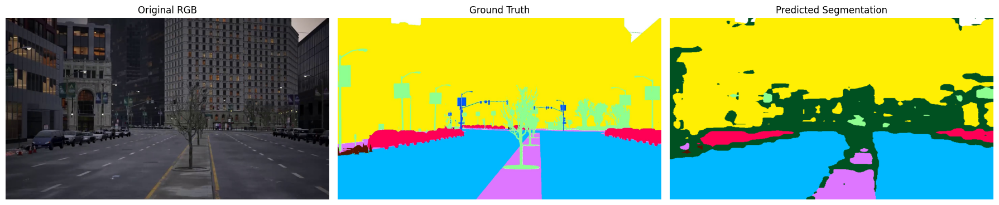

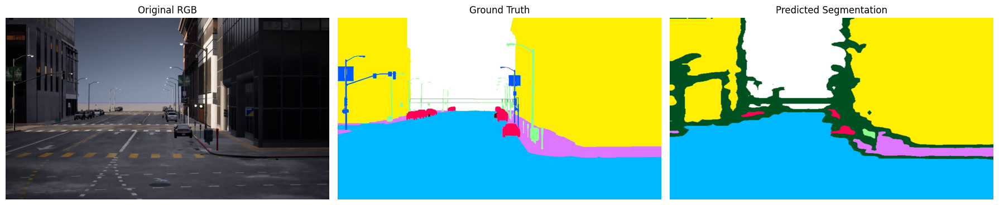

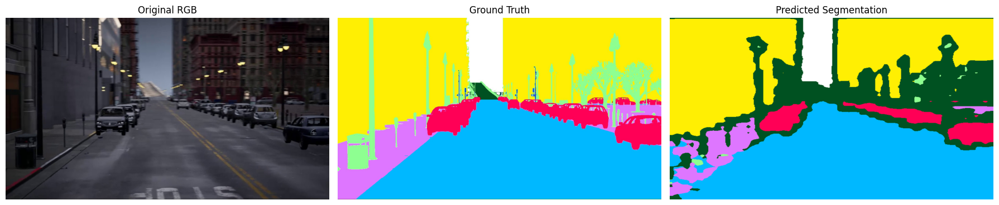

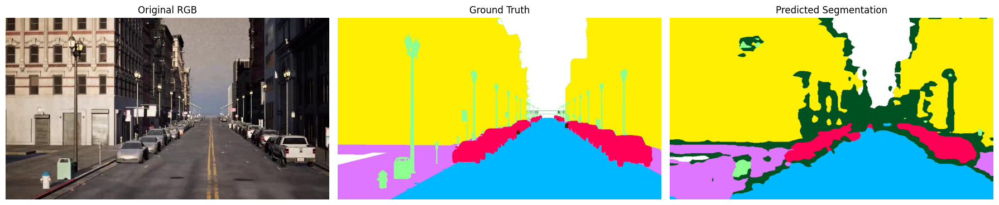

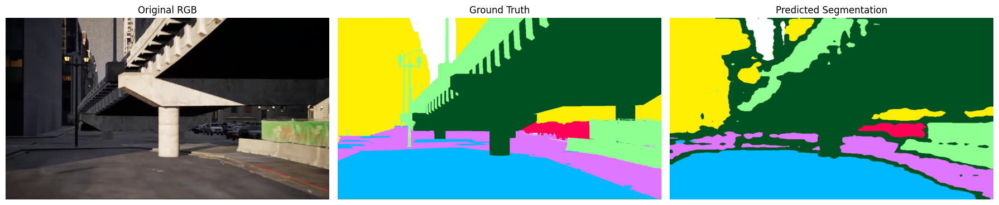

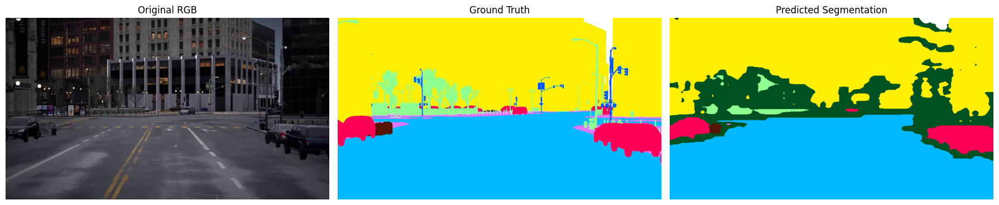

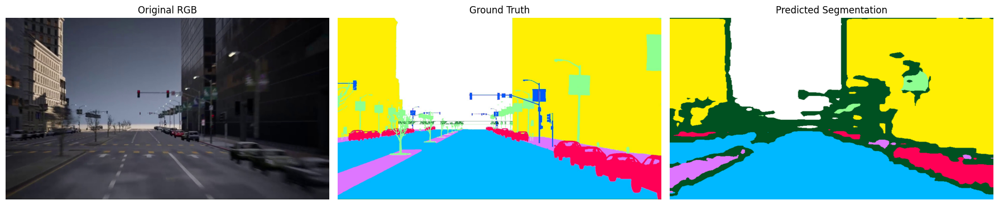

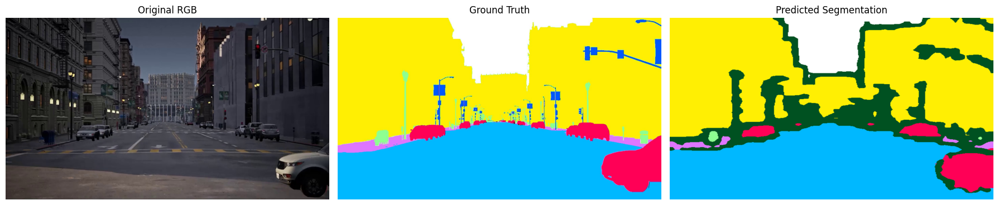

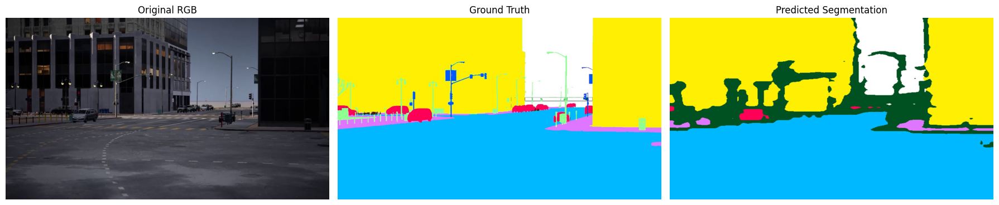

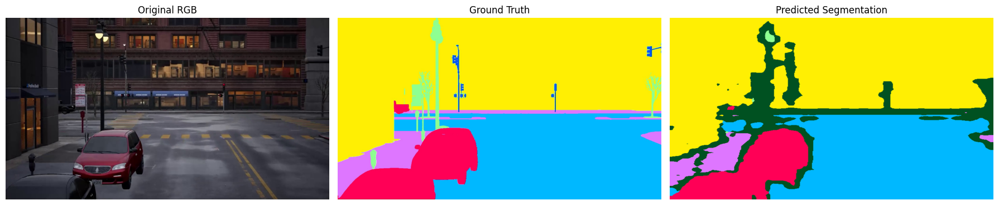

In [41]:
import os
import random
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Set model to eval mode
model.eval()

# Update paths
rgb_dir = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/RGB"
gt_dir = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/test/Semantic"

# Get all RGB filenames
rgb_files = sorted(os.listdir(rgb_dir))
random.shuffle(rgb_files)
rgb_files = rgb_files[:10]  # Select 10 random images

# Transform
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

# Function to decode segmentation
def decode_segmentation(mask, class_colors):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for idx, (class_name, color) in enumerate(class_colors.items()):
        color_mask[mask == idx] = color
    return color_mask

# Inference and plot
for fname in rgb_files:
    rgb_path = os.path.join(rgb_dir, fname)
    gt_path = os.path.join(gt_dir, fname.replace("rgb", "semantic"))

    image = Image.open(rgb_path).convert("RGB")
    gt_mask = Image.open(gt_path).convert("RGB")
    original_size = image.size

    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)['out']
        pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    pred_color = decode_segmentation(pred, class_colors)
    pred_image_resized = Image.fromarray(pred_color).resize(original_size)

    # Plot
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.title("Original RGB")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(gt_mask)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Predicted Segmentation")
    plt.imshow(pred_image_resized)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

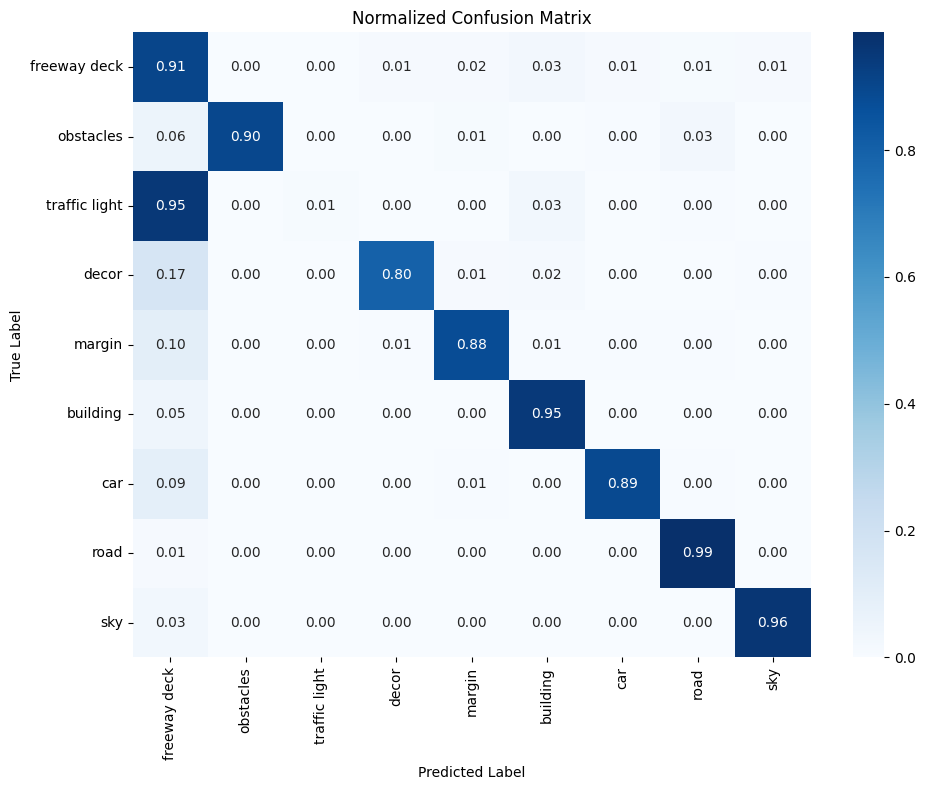

In [42]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Step 1: Gather all predictions and true labels
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, rgb_masks in tqdm(val_loader, desc="Collecting predictions for Confusion Matrix"):
        images = images.to(device)
        masks = rgb_to_class_indices(rgb_masks.numpy(), color_to_class).to(device)

        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)

        all_preds.extend(preds.cpu().numpy().flatten())
        all_labels.extend(masks.cpu().numpy().flatten())

# Step 2: Compute the confusion matrix
cm = confusion_matrix(all_labels, all_preds, labels=list(range(NUM_CLASSES)))

# Step 3: Normalize the confusion matrix
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Step 4: Plot
plt.figure(figsize=(10, 8))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Normalized Confusion Matrix")
plt.tight_layout()
plt.show()

In [44]:
class_names = ['freeway deck', 'obstacles', 'traffic light', 'decor', 'margin', 'building', 'car', 'road', 'sky']

In [ ]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# Step 1: Compute F1 scores for each class
f1_scores = f1_score(all_labels, all_preds, labels=list(range(NUM_CLASSES)), average=None)

# Step 2: Plot the F1 scores
plt.figure(figsize=(10, 6))
bars = plt.bar(class_names, f1_scores, color='skyblue')
plt.xlabel('Class')
plt.ylabel('F1 Score')
plt.title('Per-Class F1 Scores')
plt.ylim(0, 1.0)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate each bar with its F1 score
for bar, score in zip(bars, f1_scores):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.02, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

model.eval()

rgb_path = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/train/RGB/rgb_frame_007.jpg"               # ← Update
gt_mask_path = "/kaggle/input/ue-city-dataset/SyntheticData/SyntheticData/train/Semantic/rgb_frame_007.jpg" # ← Update

# Load RGB and GT mask
image = Image.open(rgb_path).convert("RGB")
gt_mask = Image.open(gt_mask_path).convert("RGB")
original_size = image.size

# Transform
transform = transforms.Compose([
    transforms.Resize((1024, 1024)),
    transforms.ToTensor()
])

# Process input image
input_tensor = transform(image).unsqueeze(0).to(device)

# Inference
model.eval()
with torch.no_grad():
    output = model(input_tensor)['out']
    pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

# Decode prediction
def decode_segmentation(mask, class_colors):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for idx, (class_name, color) in enumerate(class_colors.items()):
        color_mask[mask == idx] = color
    return color_mask

pred_color = decode_segmentation(pred, class_colors)
pred_image_resized = Image.fromarray(pred_color).resize(original_size)

# Plot
plt.figure(figsize=(18, 6))

# Original RGB
plt.subplot(1, 3, 1)
plt.title("Original RGB")
plt.imshow(image)
plt.axis("off")

# Ground Truth
plt.subplot(1, 3, 2)
plt.title("Ground Truth")
plt.imshow(gt_mask)
plt.axis("off")

# Predicted Segmentation
plt.subplot(1, 3, 3)
plt.title("Predicted Segmentation")
plt.imshow(pred_image_resized)
plt.axis("off")

plt.tight_layout()
plt.show()